In [2]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Object masks from prompts with SAM

The Segment Anything Model (SAM) predicts object masks given prompts that indicate the desired object. The model first converts the image into an image embedding that allows high quality masks to be efficiently produced from a prompt. 

The `SamPredictor` class provides an easy interface to the model for prompting the model. It allows the user to first set an image using the `set_image` method, which calculates the necessary image embeddings. Then, prompts can be provided via the `predict` method to efficiently predict masks from those prompts. The model can take as input both point and box prompts, as well as masks from the previous iteration of prediction.

In [3]:
from IPython.display import display, HTML
display(HTML(
"""
<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>
"""
))

## Environment Set-up

If running locally using jupyter, first install `segment_anything` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything#installation) in the repository. If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'.

In [4]:
using_colab = False

In [5]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything.git'
    
    !mkdir images
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/truck.jpg
    !wget -P images https://raw.githubusercontent.com/facebookresearch/segment-anything/main/notebooks/images/groceries.jpg
        
    !wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

## Set-up

Necessary imports and helper functions for displaying points, boxes, and masks.

In [6]:
import numpy as np
import torch
import matplotlib.pyplot as plt
import cv2

In [2]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)
    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   
    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    


## Example image

In [ ]:
image = cv2.imread('./segment-anything/notebooks/images/truck.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

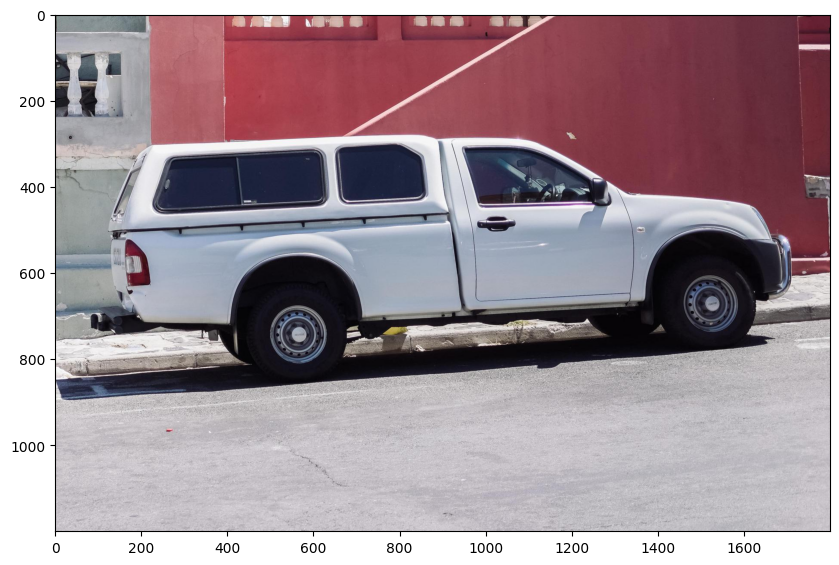

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.axis('on')
plt.show()

## Selecting objects with SAM

First, load the SAM model and predictor. Change the path below to point to the SAM checkpoint. Running on CUDA and using the default model are recommended for best results.

In [10]:
import sys
sys.path.append("..")
from segment_anything import sam_model_registry, SamPredictor

sam_checkpoint = "./checkpoint/sam_vit_b_01ec64.pth"
model_type = "vit_b"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

predictor = SamPredictor(sam)

Process the image to produce an image embedding by calling `SamPredictor.set_image`. `SamPredictor` remembers this embedding and will use it for subsequent mask prediction.

In [11]:
predictor.set_image(image)

To select the truck, choose a point on it. Points are input to the model in (x,y) format and come with labels 1 (foreground point) or 0 (background point). Multiple points can be input; here we use only one. The chosen point will be shown as a star on the image.

In [12]:
input_point = np.array([[500, 375]])
input_label = np.array([1])

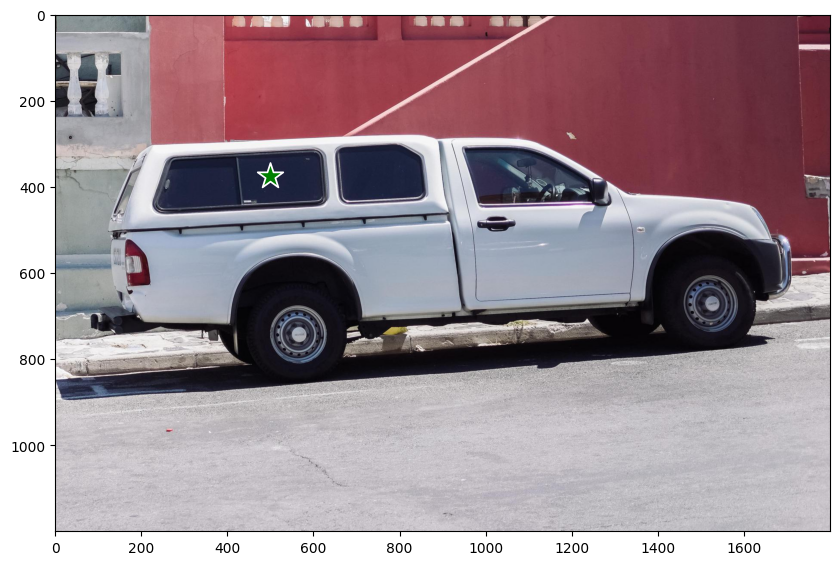

In [13]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_points(input_point, input_label, plt.gca())
plt.axis('on')
plt.show()  

Predict with `SamPredictor.predict`. The model returns masks, quality predictions for those masks, and low resolution mask logits that can be passed to the next iteration of prediction.

In [14]:
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

With `multimask_output=True` (the default setting), SAM outputs 3 masks, where `scores` gives the model's own estimation of the quality of these masks. This setting is intended for ambiguous input prompts, and helps the model disambiguate different objects consistent with the prompt. When `False`, it will return a single mask. For ambiguous prompts such as a single point, it is recommended to use `multimask_output=True` even if only a single mask is desired; the best single mask can be chosen by picking the one with the highest score returned in `scores`. This will often result in a better mask.

In [15]:
masks.shape  # (number_of_masks) x H x W

(3, 1200, 1800)

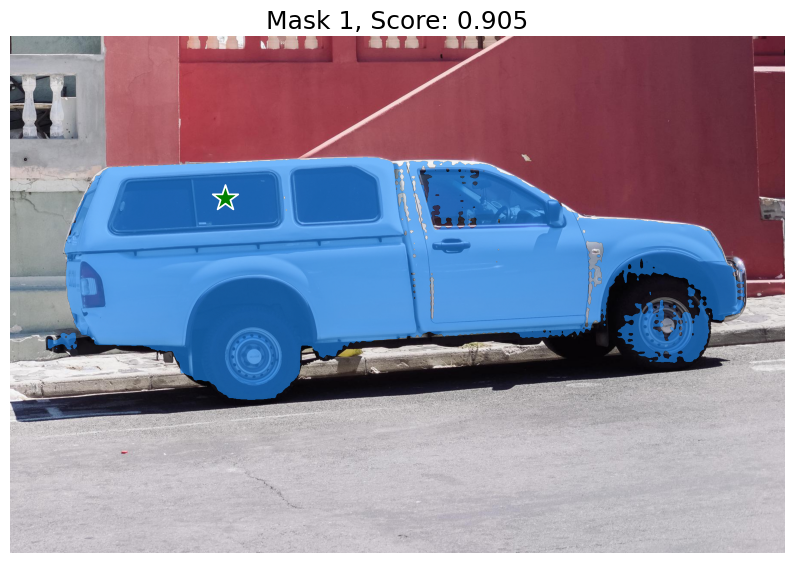

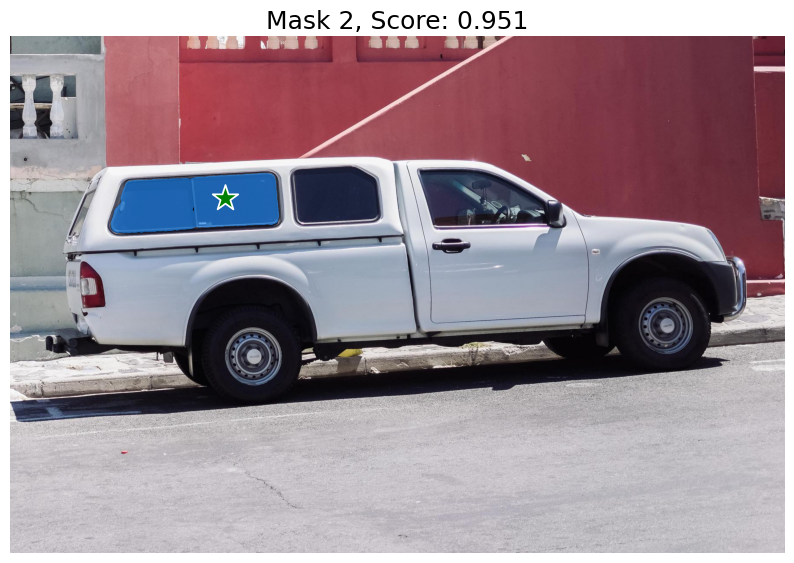

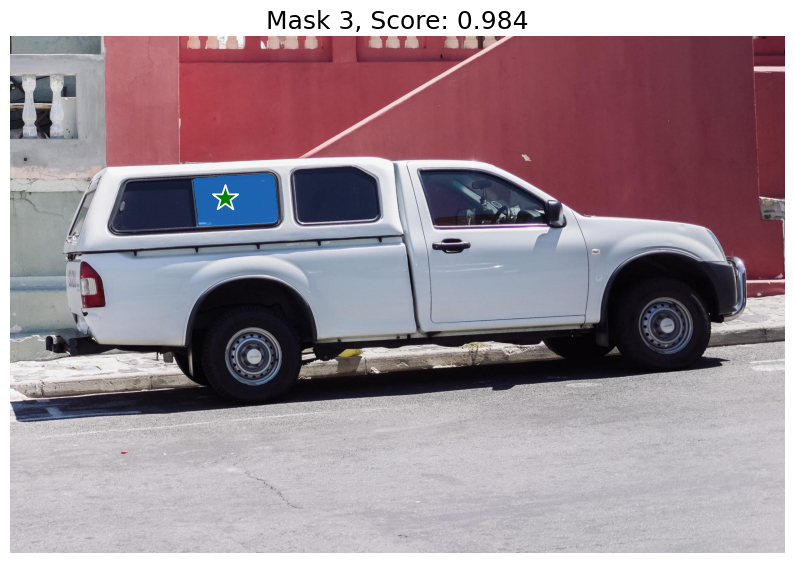

In [16]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  
  

## Specifying a specific object with additional points

The single input point is ambiguous, and the model has returned multiple objects consistent with it. To obtain a single object, multiple points can be provided. If available, a mask from a previous iteration can also be supplied to the model to aid in prediction. When specifying a single object with multiple prompts, a single mask can be requested by setting `multimask_output=False`.

In [17]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 1])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [18]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

In [19]:
masks.shape

(1, 1200, 1800)

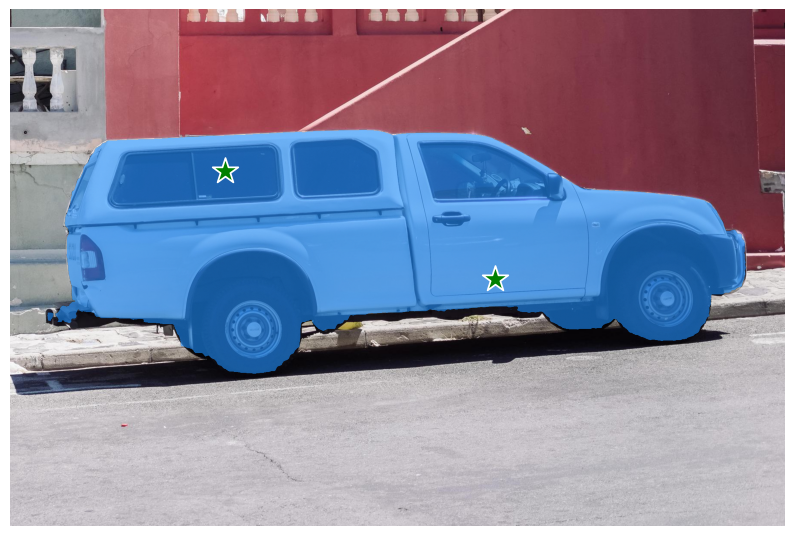

In [20]:
plt.figure(figsize=(10,10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

To exclude the car and specify just the window, a background point (with label 0, here shown in red) can be supplied.

In [21]:
input_point = np.array([[500, 375], [1125, 625]])
input_label = np.array([1, 0])

mask_input = logits[np.argmax(scores), :, :]  # Choose the model's best mask

In [22]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    mask_input=mask_input[None, :, :],
    multimask_output=False,
)

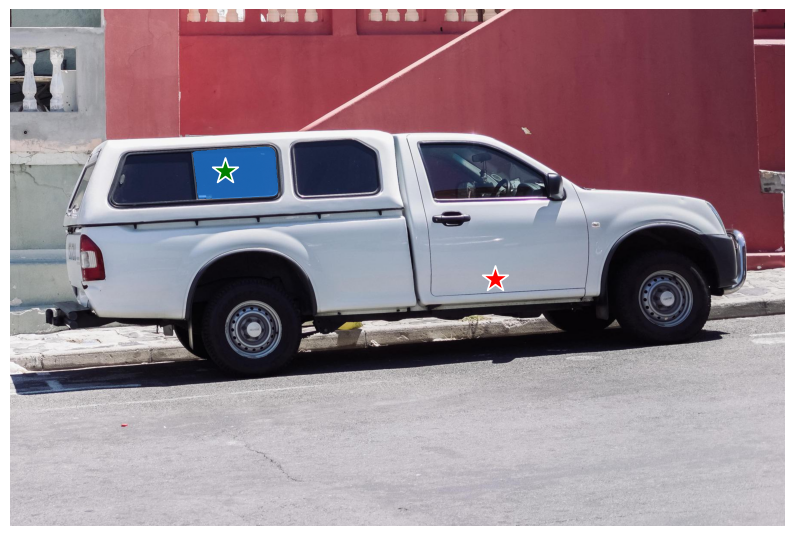

In [23]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show() 

## Specifying a specific object with a box

The model can also take a box as input, provided in xyxy format.

In [24]:
input_box = np.array([425, 600, 700, 875])

In [25]:
masks, _, _ = predictor.predict(
    point_coords=None,
    point_labels=None,
    box=input_box[None, :],
    multimask_output=False,
)

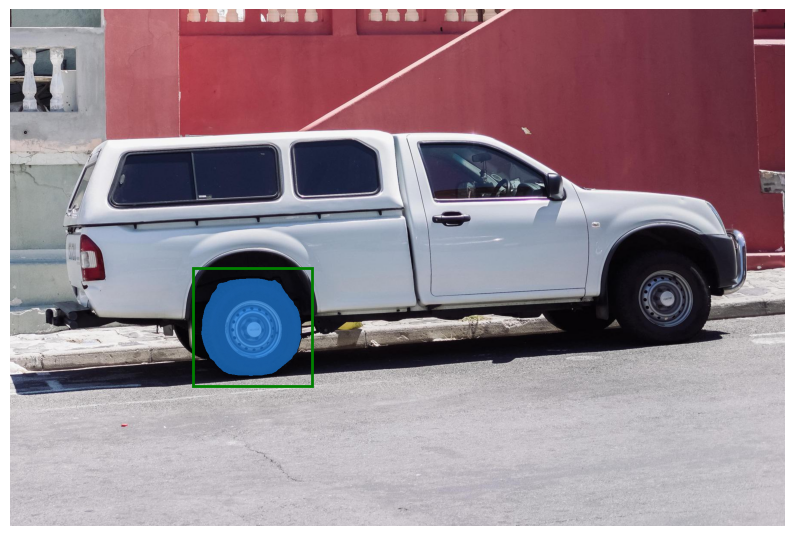

In [26]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
plt.axis('off')
plt.show()

## Combining points and boxes

Points and boxes may be combined, just by including both types of prompts to the predictor. Here this can be used to select just the trucks's tire, instead of the entire wheel.

In [27]:
input_box = np.array([425, 600, 700, 875])
input_point = np.array([[575, 750]])
input_label = np.array([0])

In [30]:
masks, _, _ = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    box=input_box,
    multimask_output=False,
)

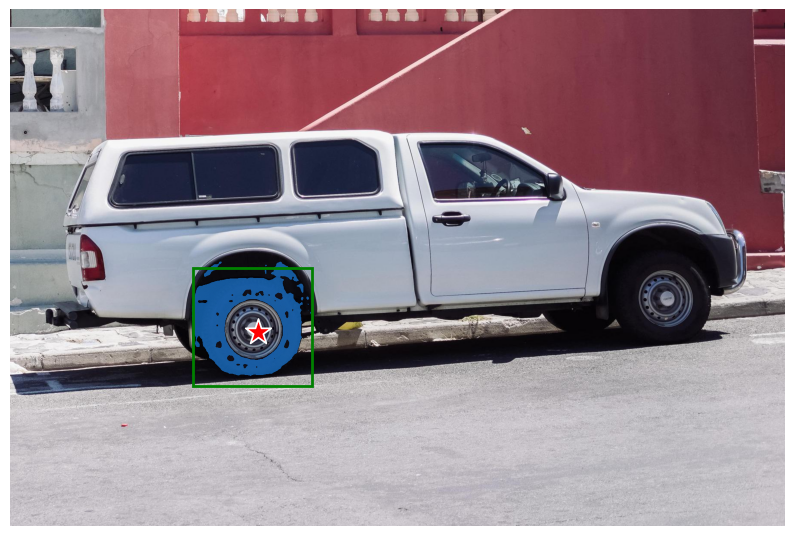

In [31]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
show_mask(masks[0], plt.gca())
show_box(input_box, plt.gca())
show_points(input_point, input_label, plt.gca())
plt.axis('off')
plt.show()

## Batched prompt inputs

SamPredictor can take multiple input prompts for the same image, using `predict_torch` method. This method assumes input points are already torch tensors and have already been transformed to the input frame. For example, imagine we have several box outputs from an object detector.

In [32]:
input_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=predictor.device)

Transform the boxes to the input frame, then predict masks. `SamPredictor` stores the necessary transform as the `transform` field for easy access, though it can also be instantiated directly for use in e.g. a dataloader (see `segment_anything.utils.transforms`).

In [33]:
transformed_boxes = predictor.transform.apply_boxes_torch(input_boxes, image.shape[:2])
masks, _, _ = predictor.predict_torch(
    point_coords=None,
    point_labels=None,
    boxes=transformed_boxes,
    multimask_output=False,
)

In [34]:
masks.shape  # (batch_size) x (num_predicted_masks_per_input) x H x W

torch.Size([4, 1, 1200, 1800])

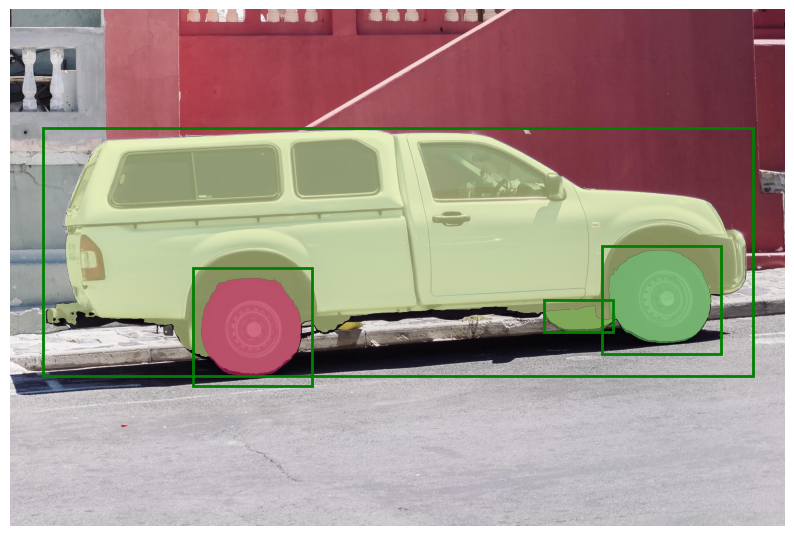

In [35]:
plt.figure(figsize=(10, 10))
plt.imshow(image)
for mask in masks:
    show_mask(mask.cpu().numpy(), plt.gca(), random_color=True)
for box in input_boxes:
    show_box(box.cpu().numpy(), plt.gca())
plt.axis('off')
plt.show()

## End-to-end batched inference

If all prompts are available in advance, it is possible to run SAM directly in an end-to-end fashion. This also allows batching over images.

In [36]:
image1 = image  # truck.jpg from above
image1_boxes = torch.tensor([
    [75, 275, 1725, 850],
    [425, 600, 700, 875],
    [1375, 550, 1650, 800],
    [1240, 675, 1400, 750],
], device=sam.device)

image2 = cv2.imread('./segment-anything/notebooks/images/groceries.jpg')
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image2_boxes = torch.tensor([
    [450, 170, 520, 350],
    [350, 190, 450, 350],
    [500, 170, 580, 350],
    [580, 170, 640, 350],
], device=sam.device)

Both images and prompts are input as PyTorch tensors that are already transformed to the correct frame. Inputs are packaged as a list over images, which each element is a dict that takes the following keys:
* `image`: The input image as a PyTorch tensor in CHW format.
* `original_size`: The size of the image before transforming for input to SAM, in (H, W) format.
* `point_coords`: Batched coordinates of point prompts.
* `point_labels`: Batched labels of point prompts.
* `boxes`: Batched input boxes.
* `mask_inputs`: Batched input masks.

If a prompt is not present, the key can be excluded.

In [37]:
from segment_anything.utils.transforms import ResizeLongestSide
resize_transform = ResizeLongestSide(sam.image_encoder.img_size)

def prepare_image(image, transform, device):
    image = transform.apply_image(image)
    image = torch.as_tensor(image, device=device.device) 
    return image.permute(2, 0, 1).contiguous()

In [38]:
batched_input = [
     {
         'image': prepare_image(image1, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image1_boxes, image1.shape[:2]),
         'original_size': image1.shape[:2]
     },
     {
         'image': prepare_image(image2, resize_transform, sam),
         'boxes': resize_transform.apply_boxes_torch(image2_boxes, image2.shape[:2]),
         'original_size': image2.shape[:2]
     }
]

Run the model.

In [39]:
batched_output = sam(batched_input, multimask_output=False)

The output is a list over results for each input image, where list elements are dictionaries with the following keys:
* `masks`: A batched torch tensor of predicted binary masks, the size of the original image.
* `iou_predictions`: The model's prediction of the quality for each mask.
* `low_res_logits`: Low res logits for each mask, which can be passed back to the model as mask input on a later iteration.

In [40]:
batched_output[0].keys()

dict_keys(['masks', 'iou_predictions', 'low_res_logits'])

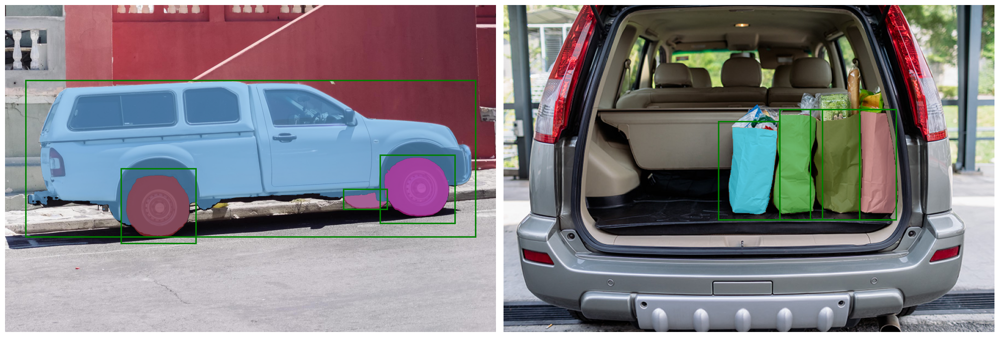

In [41]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))

ax[0].imshow(image1)
for mask in batched_output[0]['masks']:
    show_mask(mask.cpu().numpy(), ax[0], random_color=True)
for box in image1_boxes:
    show_box(box.cpu().numpy(), ax[0])
ax[0].axis('off')

ax[1].imshow(image2)
for mask in batched_output[1]['masks']:
    show_mask(mask.cpu().numpy(), ax[1], random_color=True)
for box in image2_boxes:
    show_box(box.cpu().numpy(), ax[1])
ax[1].axis('off')

plt.tight_layout()
plt.show()

# Prompt로 Text 활용하기

device='cuda'


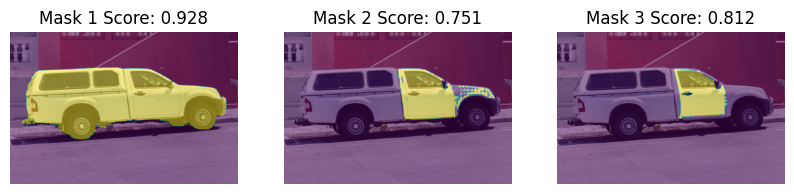

In [ ]:
import torch
import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from segment_anything import sam_model_registry, SamPredictor

# 1. 모델 로드
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'{device=}')

# CLIP 모델 (ViT-B/32 사용)
clip_model, preprocess = clip.load("ViT-L/14", device=device) # 논문에서 언급한 (ViT-L/14@336px)
# @336px 부분은 preprocess가 이미 336x336으로 자동으로 리사이즈 해주는 걸로 맞춰져 있다.

# SAM 모델 (vit_b 추천: 가벼워서)
sam_checkpoint = "./checkpoint/sam_vit_b_01ec64.pth"
model_type = "vit_b"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)

# 2. 이미지 불러오기
image_path = "./segment-anything/notebooks/images/truck.jpg"
image_pil = Image.open(image_path).convert("RGB")
image_np = np.array(image_pil)
predictor.set_image(image_np)

# 3. CLIP으로 텍스트-이미지 매칭
# (1) 이미지 조각화 (패치 단위)
patch_size = 14  # CLIP-B/32 기준
h, w, _ = image_np.shape
grid_h, grid_w = h // patch_size, w // patch_size

transform = Compose([
    Resize((224, 224)),
    CenterCrop(224),
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)) # CLIP 모델 학습할 때 사용했던 이미지 정규화 기준
])

# (2) 패치별 CLIP 유사도 계산
patch_scores = []
patch_centers = []

for i in range(grid_h):
    for j in range(grid_w):
        patch = image_pil.crop((
            j * patch_size,
            i * patch_size,
            (j+1) * patch_size,
            (i+1) * patch_size
        ))
        patch_input = transform(patch).unsqueeze(0).to(device)
        with torch.no_grad():
            patch_features = clip_model.encode_image(patch_input)
            patch_features /= patch_features.norm(dim=-1, keepdim=True)

        patch_scores.append(patch_features)
        patch_centers.append([j * patch_size + patch_size // 2, i * patch_size + patch_size // 2])

patch_scores = torch.cat(patch_scores, dim=0)  # (num_patches, feature_dim)

# (3) 텍스트 임베딩
text_prompt = "truck"  # 🔥 여기에 찾고 싶은 텍스트 입력
text_tokens = clip.tokenize([text_prompt]).to(device)
with torch.no_grad():
    text_features = clip_model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# (4) 텍스트-패치 cosine similarity 계산
similarity = (patch_scores @ text_features.T).squeeze()  # (num_patches,)

# (5) 가장 높은 점수의 패치 선택
top_patch_idx = similarity.argmax().item()
input_point = np.array([patch_centers[top_patch_idx]])  # (1, 2)
input_label = np.array([1])  # 1: foreground

# 4. SAM으로 segmentation
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

# 5. 결과 시각화
plt.figure(figsize=(10, 10))
for i, mask in enumerate(masks):
    plt.subplot(1, len(masks), i + 1)
    plt.imshow(image_np)
    plt.imshow(mask, alpha=0.5)
    plt.title(f"Mask {i+1} Score: {scores[i]:.3f}")
    plt.axis('off')
plt.show()


device='cuda'


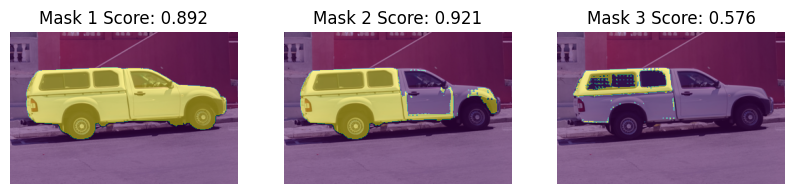

In [1]:
import torch
import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from segment_anything import sam_model_registry, SamPredictor

# 1. 모델 로드
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f'{device=}')

# CLIP 모델 (ViT-L/14 사용, 논문 기준)
clip_model, preprocess = clip.load("ViT-L/14", device=device) # 논문에서 언급한 (ViT-L/14@336px)
# @336px 부분은 preprocess가 이미 336x336으로 자동으로 리사이즈 해주는 걸로 맞춰져 있다.

# SAM 모델 (vit_b 추천: 가벼워서)
sam_checkpoint = "./checkpoint/sam_vit_b_01ec64.pth"
model_type = "vit_b"
sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)
predictor = SamPredictor(sam)

# 2. 이미지 불러오기 + CLIP에 맞게 resize
image_path = "./segment-anything/notebooks/images/truck.jpg"
image_pil = Image.open(image_path).convert("RGB")
image_pil = preprocess.transforms[0](image_pil)  # CLIP preprocess의 Resize(336) 적용
image_np = np.array(image_pil)

predictor.set_image(image_np)

# 3. CLIP으로 텍스트-이미지 매칭
# (1) 이미지 조각화 (패치 단위)
patch_size = 14  # ViT-L/14 기준 patch size는 14
h, w, _ = image_np.shape
grid_h, grid_w = h // patch_size, w // patch_size

transform = Compose([
    Resize((224, 224)),
    CenterCrop(224),
    ToTensor(),
    Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711)) # CLIP 모델 학습할 때 사용했던 이미지 정규화 기준
])

# (2) 패치별 CLIP 유사도 계산
patch_scores = []
patch_centers = []

for i in range(grid_h):
    for j in range(grid_w):
        patch = image_pil.crop((
            j * patch_size,
            i * patch_size,
            (j+1) * patch_size,
            (i+1) * patch_size
        ))
        patch_input = transform(patch).unsqueeze(0).to(device)
        with torch.no_grad():
            patch_features = clip_model.encode_image(patch_input)
            patch_features /= patch_features.norm(dim=-1, keepdim=True)

        patch_scores.append(patch_features)
        patch_centers.append([j * patch_size + patch_size // 2, i * patch_size + patch_size // 2])

patch_scores = torch.cat(patch_scores, dim=0)  # (num_patches, feature_dim)

# (3) 텍스트 임베딩
text_prompt = "truck"  # 🔥 찾고 싶은 텍스트
text_tokens = clip.tokenize([text_prompt]).to(device)
with torch.no_grad():
    text_features = clip_model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1, keepdim=True)

# (4) 텍스트-패치 cosine similarity 계산
similarity = (patch_scores @ text_features.T).squeeze()  # (num_patches,)

# (5) 가장 높은 점수의 패치 선택
top_patch_idx = similarity.argmax().item()
input_point = np.array([patch_centers[top_patch_idx]])  # (1, 2)
input_label = np.array([1])  # 1: foreground

# 4. SAM으로 segmentation
masks, scores, logits = predictor.predict(
    point_coords=input_point,
    point_labels=input_label,
    multimask_output=True,
)

# 5. 결과 시각화
plt.figure(figsize=(10, 10))
for i, mask in enumerate(masks):
    plt.subplot(1, len(masks), i + 1)
    plt.imshow(image_np)
    plt.imshow(mask, alpha=0.5)
    plt.title(f"Mask {i+1} Score: {scores[i]:.3f}")
    plt.axis('off')
plt.show()


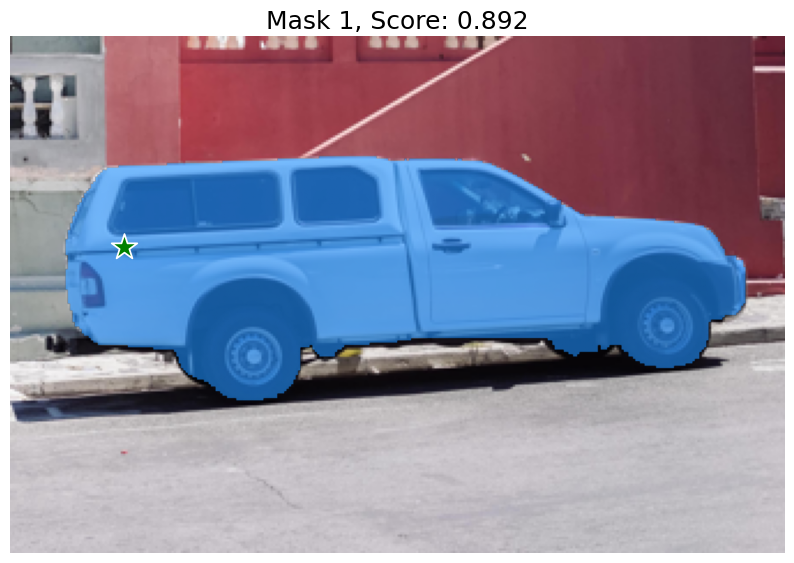

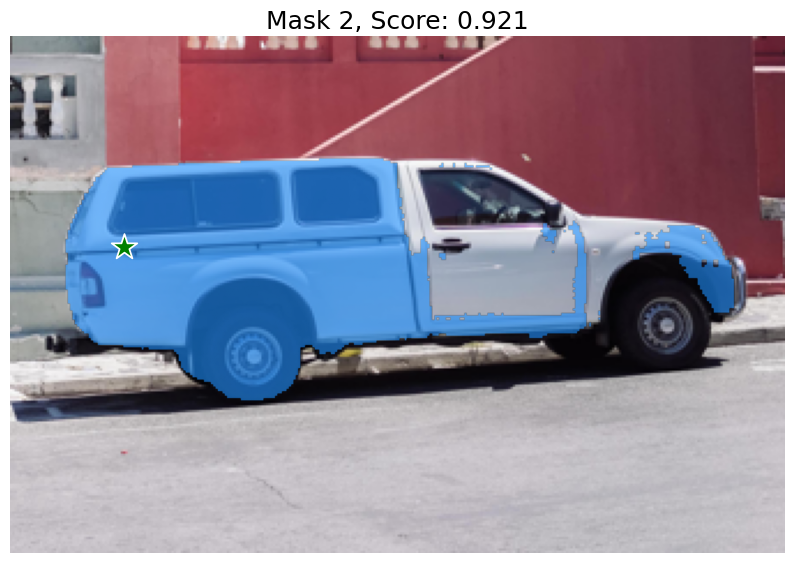

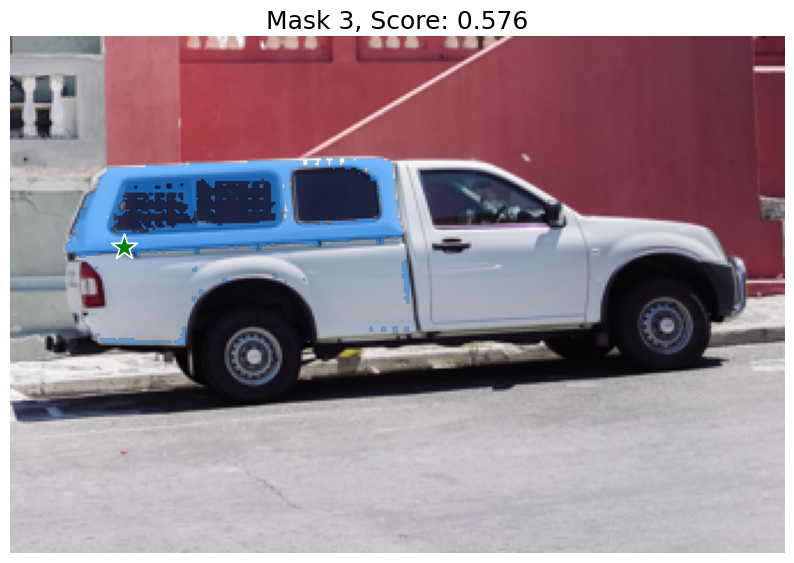

In [3]:
for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image_np)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()  

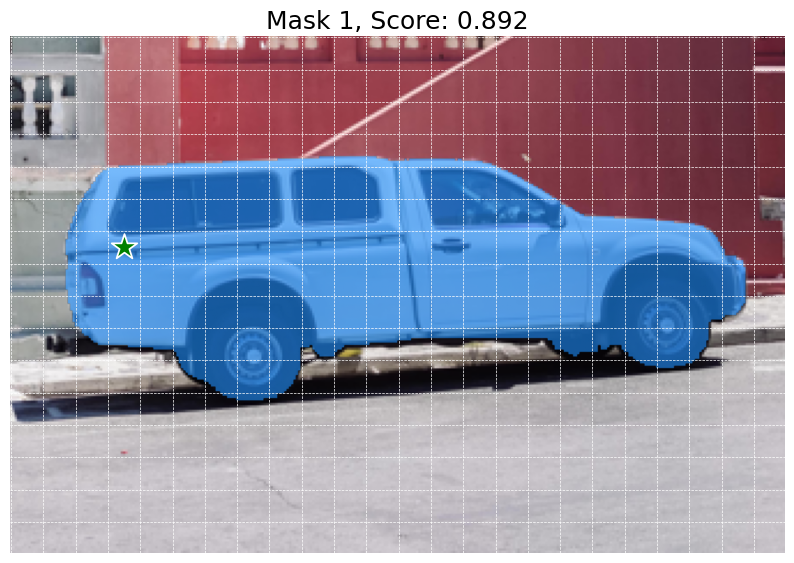

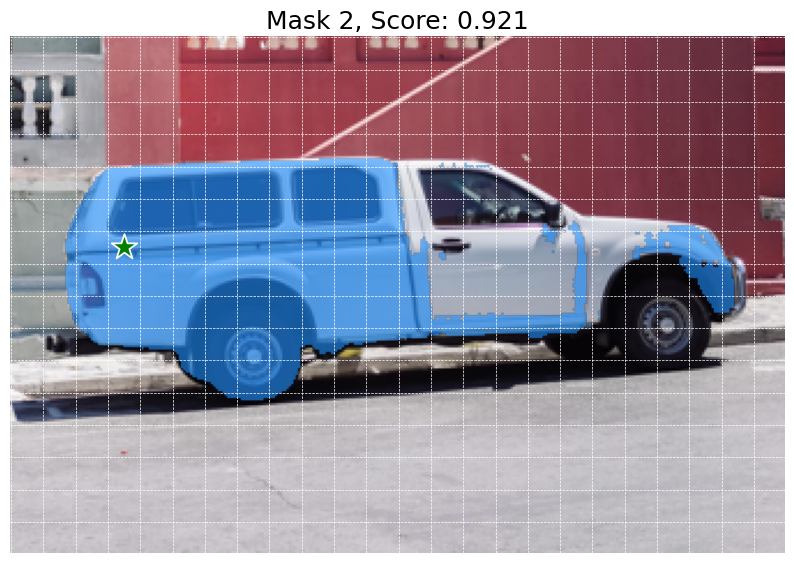

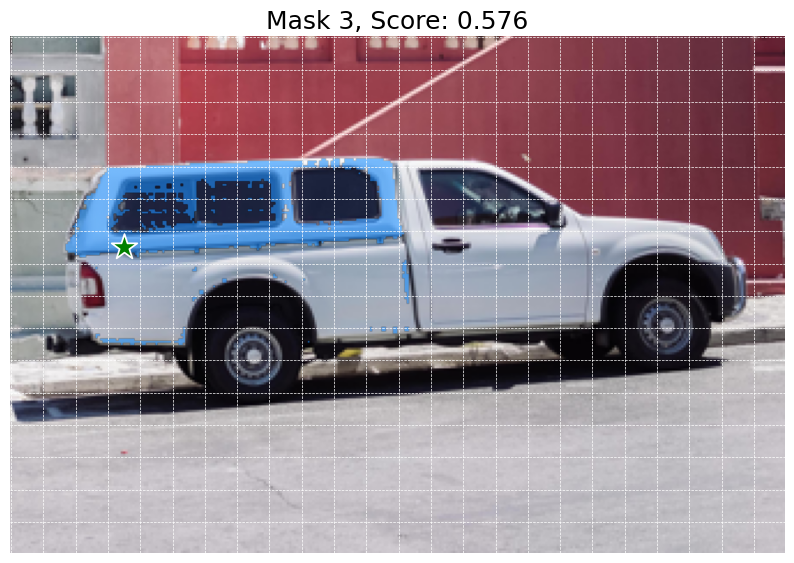

In [4]:
# 패치 크기 설정 (예: 32)
patch_size = 14
h, w, _ = image_np.shape

for i, (mask, score) in enumerate(zip(masks, scores)):
    plt.figure(figsize=(10,10))
    plt.imshow(image_np)
    show_mask(mask, plt.gca())
    show_points(input_point, input_label, plt.gca())
    
    # === 여기서 패치 경계 그리기 ===
    ax = plt.gca()

    # 세로줄
    for x in range(0, w, patch_size):
        ax.axvline(x, color='white', linestyle='--', linewidth=0.5)
    
    # 가로줄
    for y in range(0, h, patch_size):
        ax.axhline(y, color='white', linestyle='--', linewidth=0.5)
    # =================================

    plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
    plt.axis('off')
    plt.show()


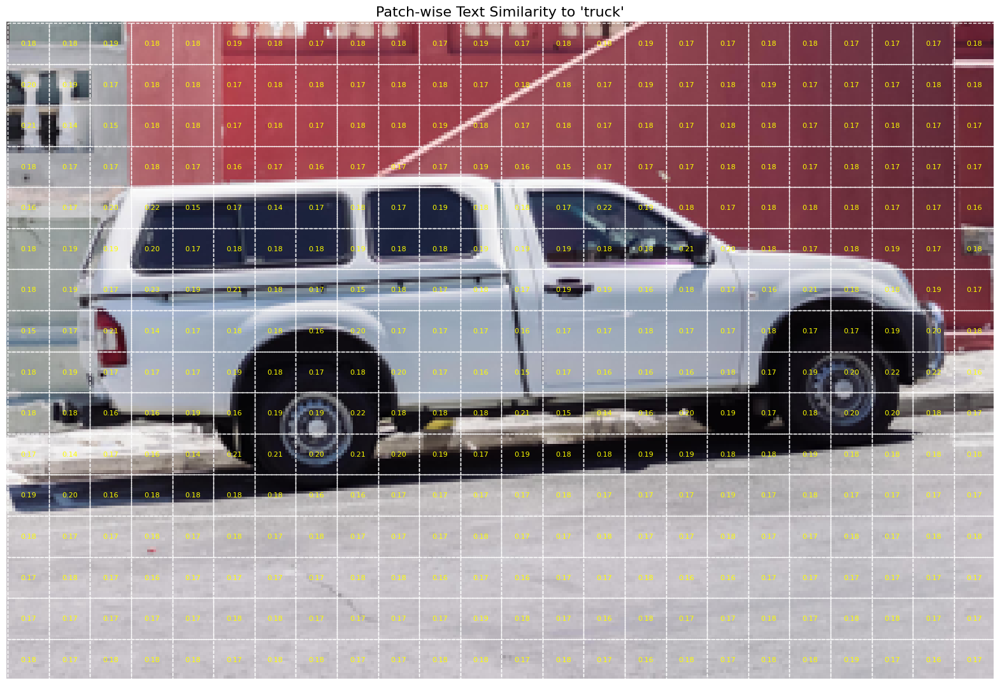

In [5]:
import matplotlib.patches as patches

# 패치 크기
patch_size = 14
h, w, _ = image_np.shape
grid_h, grid_w = h // patch_size, w // patch_size

# similarity는 (num_patches,) 벡터임
similarity_2d = similarity.view(grid_h, grid_w).cpu().numpy()

# 시각화
fig, ax = plt.subplots(figsize=(20, 20))
ax.imshow(image_np)

# 패치별로 박스 그리고 유사도 표시
for i in range(grid_h):
    for j in range(grid_w):
        score = similarity_2d[i, j]

        # 패치 경계 박스
        rect = patches.Rectangle((j*patch_size, i*patch_size), patch_size, patch_size,
                                 linewidth=1, edgecolor='white', facecolor='none', linestyle='--')
        ax.add_patch(rect)

        # 패치 중앙에 점수 표시
        ax.text(j*patch_size + patch_size/2, i*patch_size + patch_size/2,
                f"{score:.2f}", color='yellow', ha='center', va='center', fontsize=8)

plt.title(f"Patch-wise Text Similarity to '{text_prompt}'", fontsize=16)
plt.axis('off')
plt.show()


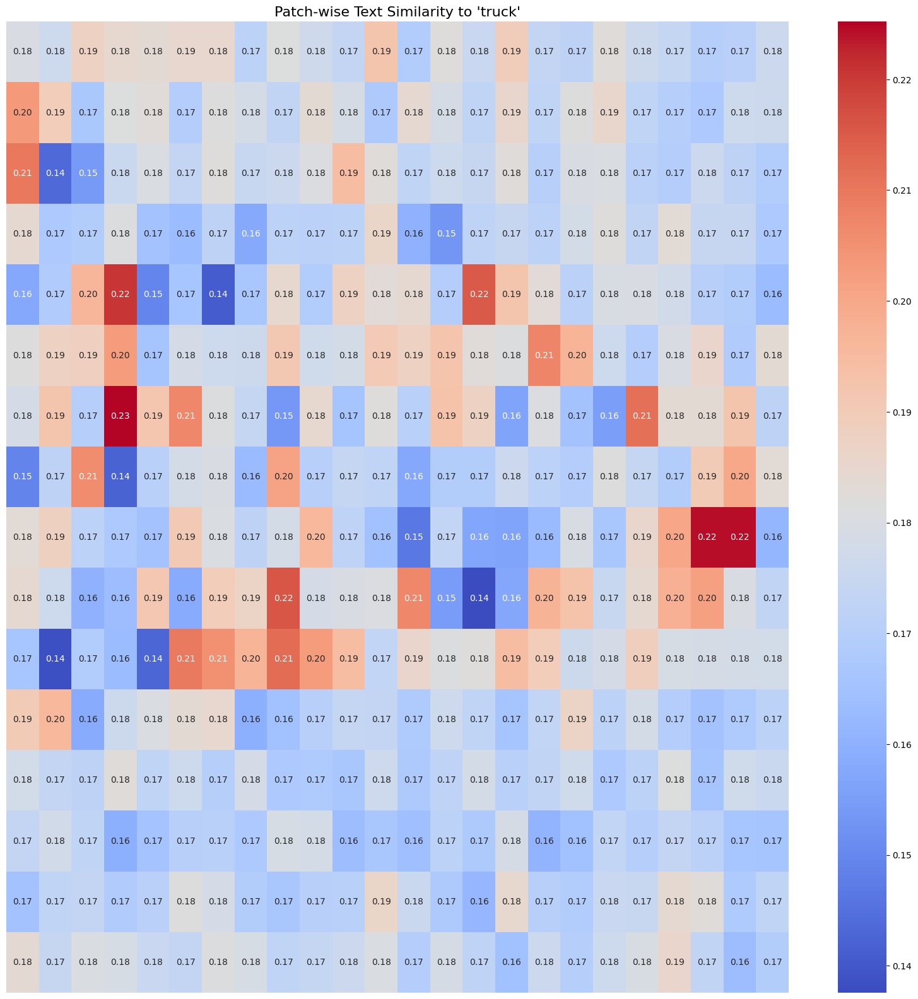

In [6]:
import seaborn as sns

# heatmap 그리기
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(similarity_2d, annot=True, fmt=".2f", cmap="coolwarm", cbar=True, ax=ax)

plt.title(f"Patch-wise Text Similarity to '{text_prompt}'", fontsize=16)
plt.axis('off')
plt.show()


In [ ]:
# 텍스트를 점 프롬프트로 변환하는 과정에서 패치 단위로 유사도를 비교하기 때문에 위와 같은 한계점이 있다. 다양하지 못한 resolution.